In [1]:
import nltk; nltk.download('stopwords')

import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy
import textblob

# Plotting tools
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\prana\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
from datetime import datetime
from tqdm import tqdm
from matplotlib import pyplot as plt

In [4]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [6]:
import pandas as pd

pd.options.mode.chained_assignment = None

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
stop = set(stopwords.words('english'))
from string import punctuation

from collections import Counter
import re
import numpy as np

from tqdm import tqdm_notebook
tqdm_notebook().pandas()

0it [00:00, ?it/s]

In [7]:
%cd "D:\Pranav_Files\Northwestern University\Classes\MSDS_498_Capstone_Project\Data and Git\Capstone_Project\data\Final_data\"

D:\Pranav_Files\Northwestern University\Classes\MSDS_498_Capstone_Project\Data and Git\Capstone_Project\data\Final_data


In [8]:
df= pd.read_csv("lement_but_not_removing_stop.csv")

In [9]:
df["class"].unique()

array(['suicide', 'casual-talk', 'depression', 'high-suicidal',
       'stressed'], dtype=object)

<AxesSubplot: >

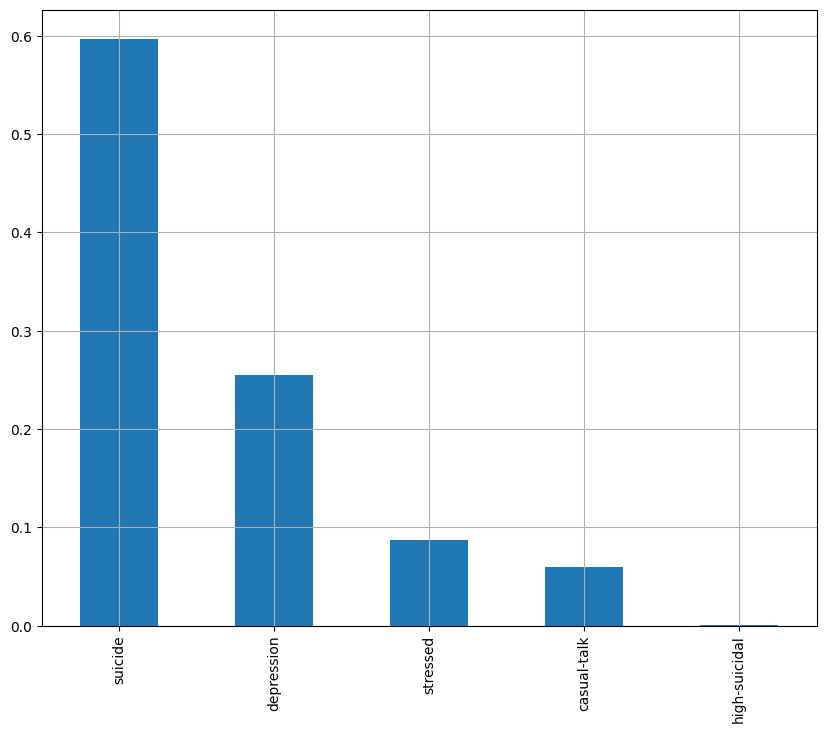

In [12]:

df["class"].value_counts(normalize=True).plot(kind='bar', grid=True, figsize=(10, 8))

<AxesSubplot: >

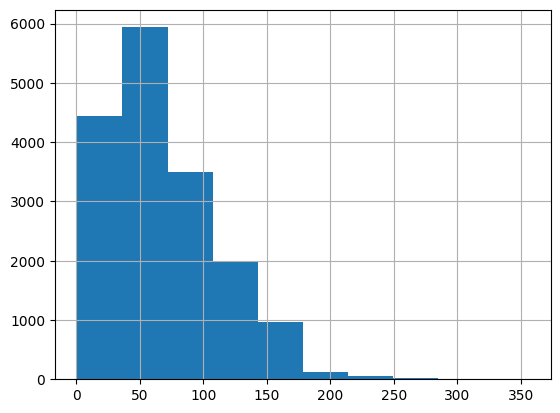

In [13]:
df["final_cleaned_textt"].apply(lambda x: len(set(str(x).split()))).hist()


<AxesSubplot: >

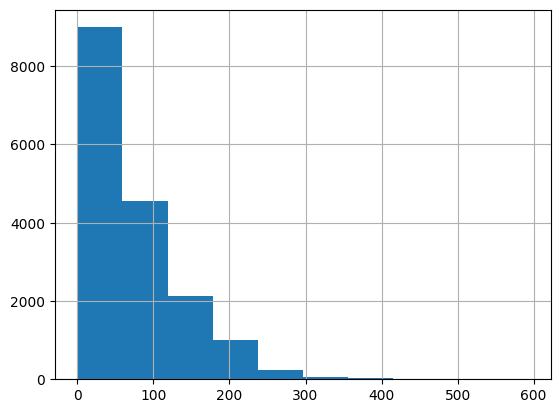

In [7]:
from wordcloud import STOPWORDS
### Other way to retrieve stopwords
# import nltk
# nltk.download(‘stopwords’)
# stopwords =set(stopwords.words(‘english’))
df["final_cleaned_textt"].apply(lambda x: len([w for w in str(x).lower().split() if w in stop_words])).hist()

In [21]:
from nltk.tokenize import word_tokenize
df['tokenized_text'] = df['final_cleaned_textt'].apply(word_tokenize) 
df.head(2)

,Unnamed: 0,cleaned_text,class,selftext_length,final_cleaned_textt,tokenized_text
0,0,what is the point see no point in doing life y...,suicide,282,what be the point see no point in do life you ...,"[what, be, the, point, see, no, point, in, do,..."
1,1,had shotgun off safety in my mouth today i am ...,suicide,308,have shotgun off safety in my mouth today I be...,"[have, shotgun, off, safety, in, my, mouth, to..."


In [30]:
df=df.drop_duplicates('final_cleaned_textt')
data=pd.DataFrame()
data["description"]=df["final_cleaned_textt"]
data['tokens']=df['tokenized_text']
data["category"] =df ["class"]

In [26]:
data = data[~data['description'].isnull()]

print(data.shape)

(17017, 3)


In [31]:
data.head(2)

,description,tokens,category
0,what be the point see no point in do life you ...,"[what, be, the, point, see, no, point, in, do,...",suicide
1,have shotgun off safety in my mouth today I be...,"[have, shotgun, off, safety, in, my, mouth, to...",suicide


In [28]:
data = data[(data.description.map(len) > 140) & (data.description.map(len) <= 300)]
data.reset_index(inplace=True, drop=True)

print(data.shape)

(3455, 3)


<AxesSubplot: >

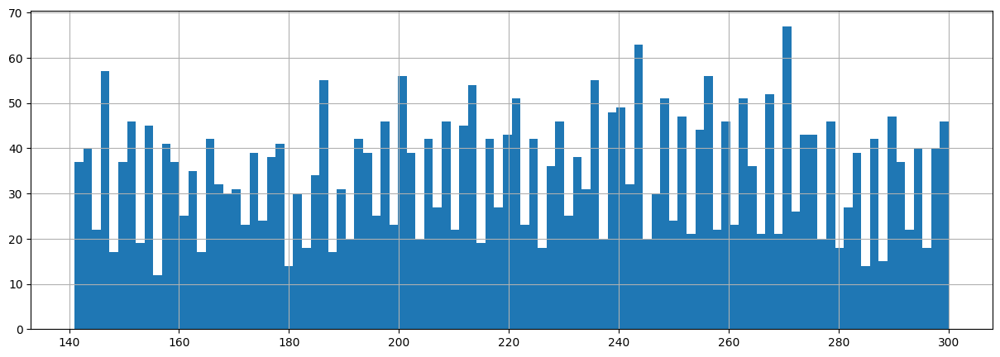

In [29]:
data.description.map(len).hist(figsize=(15, 5), bins=100)

## Text processing : tf-idf

## The higher the TF-IDF score the more important or relevant the term is; 
## as a term gets less relevant, its TF-IDF score will approach 0

In [32]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=5, analyzer='word', ngram_range=(1, 2), stop_words='english')
vz = vectorizer.fit_transform(list(data['tokens'].map(lambda tokens: ' '.join(tokens))))

vz.shape

(17017, 26833)

In [33]:
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


<AxesSubplot: >

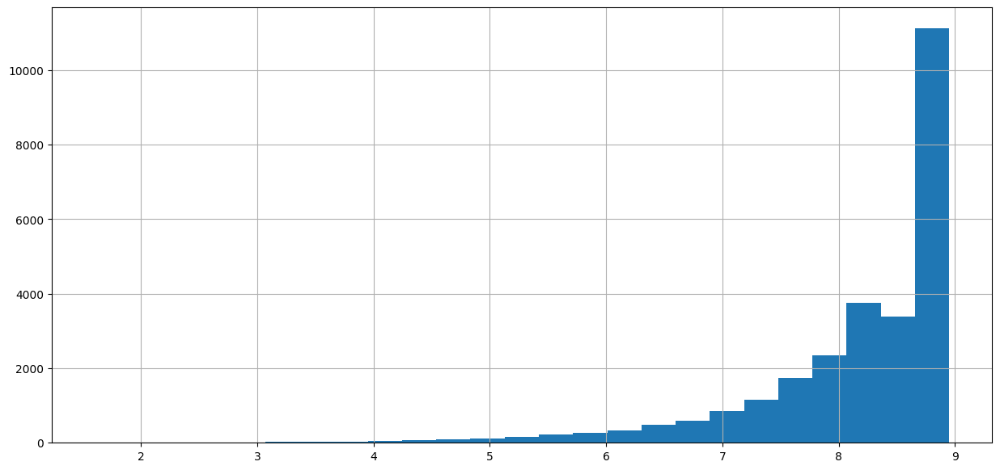

In [34]:
tfidf.tfidf.hist(bins=25, figsize=(15,7))

#### Let's display the 30 tokens that have the lowest tfidf scores

In [35]:
from wordcloud import WordCloud

def plot_word_cloud(terms):
    text = terms.index
    text = ' '.join(list(text))
    # lower max_font_size
    wordcloud = WordCloud(max_font_size=40).generate(text)
    plt.figure(figsize=(25, 25))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

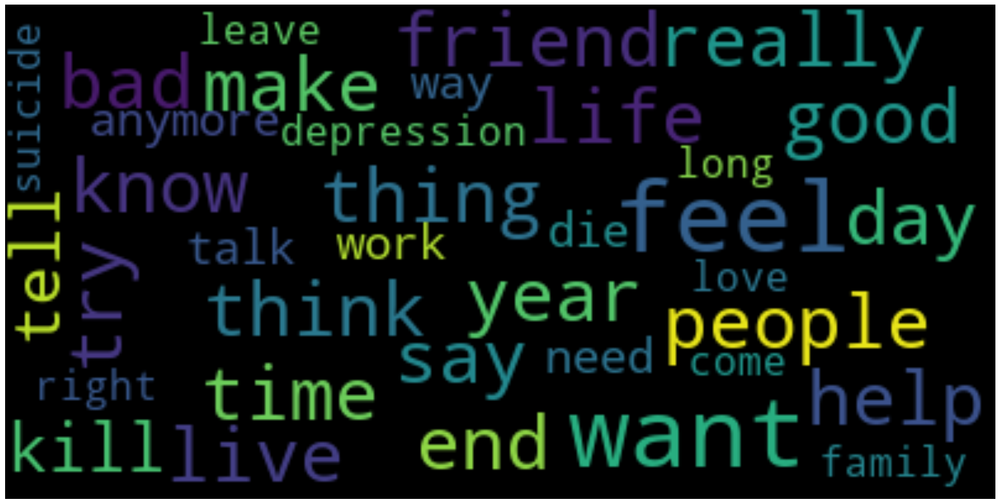

In [36]:

plot_word_cloud(tfidf.sort_values(by=['tfidf'], ascending=True).head(40))

#### Now let's check out the 30 words with the highest tfidf scores.

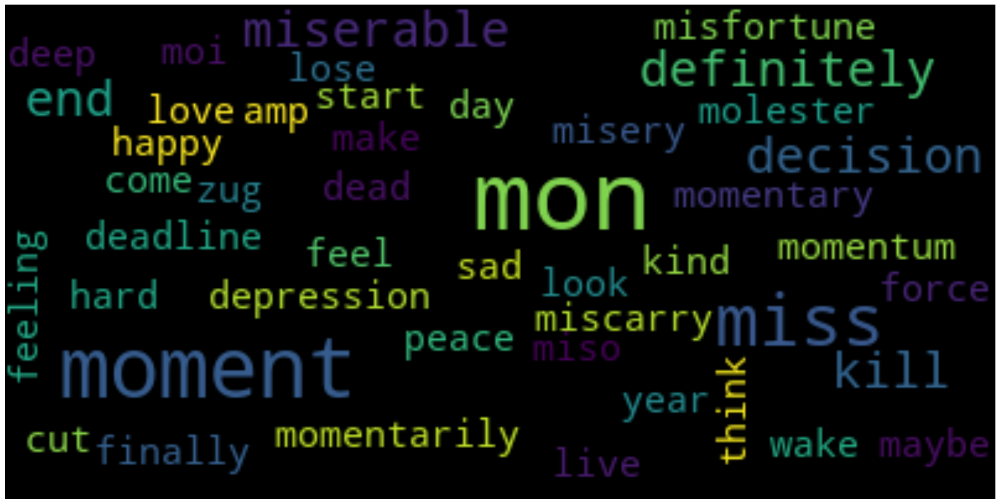

In [37]:
plot_word_cloud(tfidf.sort_values(by=['tfidf'], ascending=False).head(40))

## Let's start reducing the dimension of each vector to 50 by SVD. Since our dataset has over 20K sfeatures

In [38]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=50, random_state=0)
svd_tfidf = svd.fit_transform(vz)

svd_tfidf.shape

(17017, 50)

In [39]:
run = False
if run:
# run this (takes times)
    from sklearn.manifold import TSNE
    tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=500)
    tsne_tfidf = tsne_model.fit_transform(svd_tfidf)
    print(tsne_tfidf.shape)
    tsne_tfidf_df = pd.DataFrame(tsne_tfidf)
    tsne_tfidf_df.columns = ['x', 'y']
    tsne_tfidf_df['category'] = data['category']
    tsne_tfidf_df['description'] = data['description']
    tsne_tfidf_df.to_csv('tsne_tfidf.csv', encoding='utf-8', index=False)
else:
# or import the dataset directly
    tsne_tfidf_df = pd.read_csv('tsne_tfidf.csv')

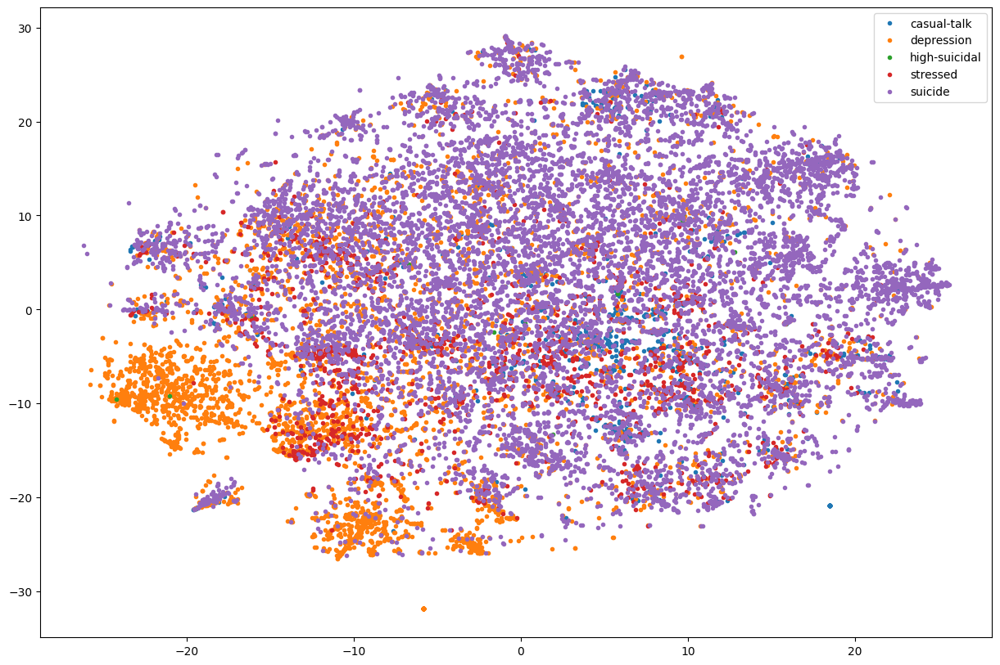

In [42]:
groups = tsne_tfidf_df.groupby('category')
fig, ax = plt.subplots(figsize=(15, 10))
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.plot(group.x, group.y, marker='.', linestyle='', label=name)
ax.legend()
plt.show()

# 4 - Clustering
## K Means

In [43]:
vz.shape


(17017, 26833)

In [44]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.metrics import silhouette_score

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer

In [45]:
distorsions = []
sil_scores = []
k_max = 80
for k in tqdm_notebook(range(2, k_max)):
    kmeans_model = MiniBatchKMeans(n_clusters=k, init='k-means++', n_init=1, random_state=42,  
                         init_size=1000, verbose=False, max_iter=1000)
    kmeans_model.fit(vz)
    sil_score = silhouette_score(vz, kmeans_model.labels_)
    sil_scores.append(sil_score)
    distorsions.append(kmeans_model.inertia_)

  0%|          | 0/78 [00:00<?, ?it/s]

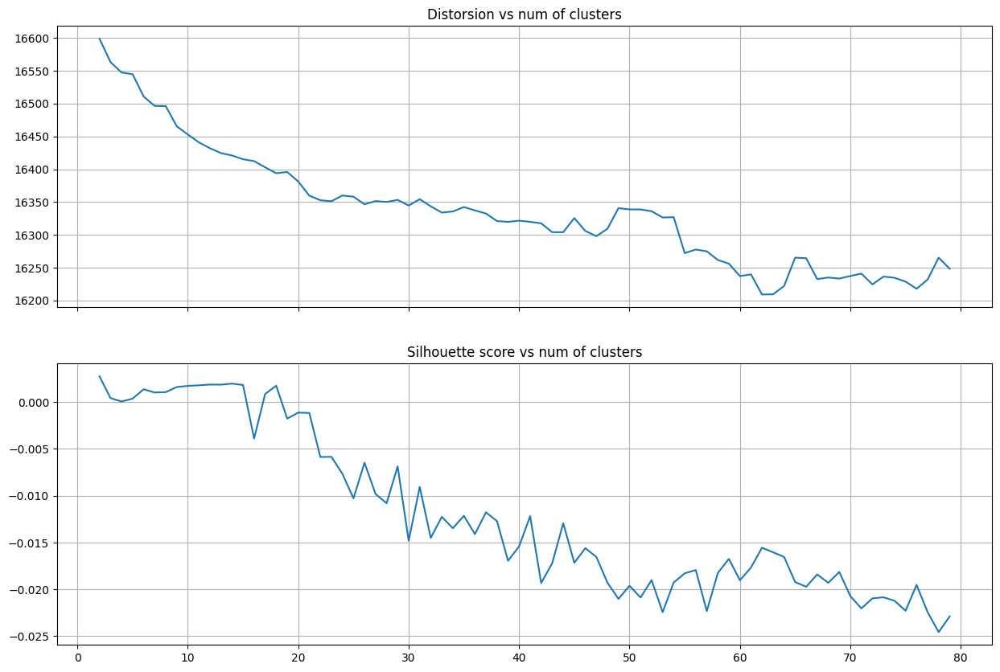

In [46]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(15, 10))

ax1.plot(range(2, k_max), distorsions)
ax1.set_title('Distorsion vs num of clusters')
ax1.grid(True)

ax2.plot(range(2, k_max), sil_scores)
ax2.set_title('Silhouette score vs num of clusters')
ax2.grid(True)

## Choosing num culster 50 because it a decent drop at 50

In [47]:
num_clusters = 50
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='k-means++', n_init=1, random_state=42,                       
                         init_size=1000, batch_size=1000, verbose=False, max_iter=1000, )
kmeans = kmeans_model.fit(vz)
kmeans_clusters = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

In [54]:
kmeans_distances2 = kmeans.fit_transform(vz)

In [48]:
for (i, desc),category in zip(enumerate(data.description),data['category']):
    if(i < 5):
        print("Cluster " + str(kmeans_clusters[i]) + ": " + desc + 
              "(distance: " + str(kmeans_distances[i][kmeans_clusters[i]]) + ")")
        print('category: ',category)
        print('---')

Cluster 8: what be the point see no point in do life you just die at the end why not take the short way why people live they will not even know after jizzkzlzjaknzlff man look I be write shit I do not even know I breakdown for nothing hold my emotion when family a around a know I fail everything every sport always shit in school I get under french grading system in sport I be so shit in my st high school year I luckily pass in economic fail almost all class under the average in majority so it be vacation finally say to myself of I will try find some mate on counter strike practice against other team and join online tournament you do not know but I like this shit the communication the trill win a round that seem impossible yeah then my mother goes say after a few day I can not play anymore for all time because she do not want she will zzz stszdydjzjdbezosnd I have nothing to do now I be a piece of shit at anything try to learn create a website fail at this pop piece of shit programming 

### This doesn't tell us much. What we need to look up are the "hot" keywords that describe each clusters.

In [49]:
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
all_keywords = []
for i in range(num_clusters):
    topic_keywords = []
    for j in sorted_centroids[i, :10]:
        topic_keywords.append(terms[j])
    all_keywords.append(topic_keywords)

keywords_df = pd.DataFrame(index=['topic_{0}'.format(i) for i in range(num_clusters)], 
                           columns=['keyword_{0}'.format(i) for i in range(10)],
                           data=all_keywords)
keywords_df

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,keyword_0,keyword_1,keyword_2,keyword_3,keyword_4,keyword_5,keyword_6,keyword_7,keyword_8,keyword_9
topic_0,fucking wish,wish mother,mother love,way wish,blunt,plan,intervention,wish talk,god know,plan suicide
topic_1,high expectation,high,harsh,like piece,sub,post sub,read post,expectation,situation,read
topic_2,nasty,starve,comment,destroy body,right miss,body image,daughter want,body,body like,night say
topic_3,post lose,feel wanted,love guess,wish friend,wanted,friend maybe,guess know,know deserve,maybe feel,lose just
topic_4,mon sit,sit table,person know,table,shower,baby,event,sit,mon,person
topic_5,tired,birthday,tired tired,just,day,want,feel,tired feel,today,just tired
topic_6,afraid day,ontario,canadian,willing help,help afraid,day actually,think parent,help,actually kill,seek help
topic_7,ban,post thought,merely,notify,submit,depression think,post like,advise,grant,post
topic_8,fuck,fucking,just,life,shit,want,fuck fuck,like,just fuck,fuck life
topic_9,need talk,need,talk,just need,just,really,help,feel,pm,skype


In [57]:
warnings.filterwarnings(action='ignore', category=UserWarning, module='gensim')

import gensim
import gensim.corpora as corpora
from gensim import matutils
from gensim.models import CoherenceModel

In [58]:
aux = data.copy()

bigram = gensim.models.Phrases(aux['tokens'], min_count=5, threshold=100)
bigram_mod = gensim.models.phrases.Phraser(bigram)
aux['tokens_bigram'] = aux['tokens'].progress_map(lambda tokens: bigram_mod[tokens])

id2word = corpora.Dictionary(aux['tokens_bigram'])
texts = aux['tokens_bigram'].values
corpus = [id2word.doc2bow(text) for text in texts]

  0%|          | 0/17017 [00:00<?, ?it/s]

In [59]:
def LDA_model(num_topics, passes=1):
    return gensim.models.ldamodel.LdaModel(corpus=tqdm_notebook(corpus, leave=False),
                                               id2word=id2word,
                                               num_topics=num_topics, 
                                               random_state=100,
                                               eval_every=10,
                                               chunksize=2000,
                                               passes=passes,
                                               per_word_topics=True
                                            )

In [60]:
def compute_coherence(model):
    coherence = CoherenceModel(model=model, 
                           texts=aux['tokens_bigram'].values,
                           dictionary=id2word, coherence='c_v')
    return coherence.get_coherence()

In [61]:
def display_topics(model):
    topics = model.show_topics(num_topics=model.num_topics, formatted=False, num_words=10)
    topics = map(lambda c: map(lambda cc: cc[0], c[1]), topics)
    df = pd.DataFrame(topics)
    df.index = ['topic_{0}'.format(i) for i in range(model.num_topics)]
    df.columns = ['keyword_{0}'.format(i) for i in range(1, 10+1)]
    return df

In [62]:
def explore_models(df, rg=range(5, 25)):
    id2word = corpora.Dictionary(df['tokens_bigram'])
    texts = df['tokens_bigram'].values
    corpus = [id2word.doc2bow(text) for text in texts]

    models = []
    coherences = []
    
    for num_topics in tqdm_notebook(rg, leave=False):
        lda_model = LDA_model(num_topics, passes=5)
        models.append(lda_model)
        coherence = compute_coherence(lda_model)
        coherences.append(coherence)
      

    fig = plt.figure(figsize=(15, 5))
    plt.title('Choosing the optimal number of topics')
    plt.xlabel('Number of topics')
    plt.ylabel('Coherence')
    plt.grid(True)
    plt.plot(rg, coherences)
    
    return coherences, models

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

  0%|          | 0/17017 [00:00<?, ?it/s]

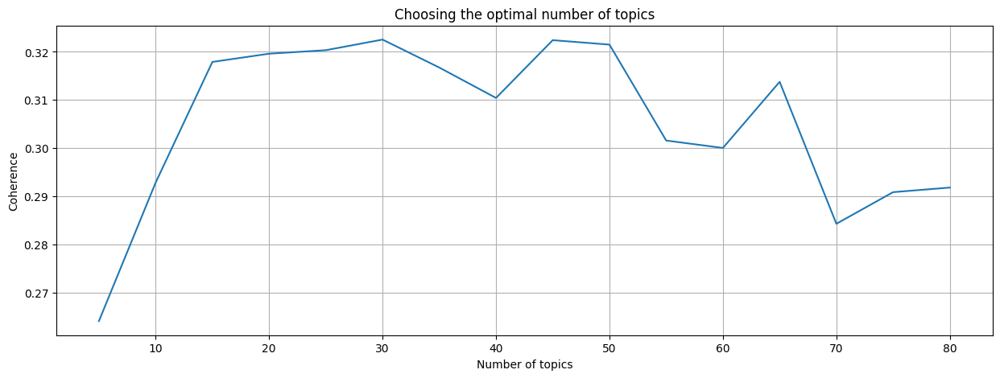

In [63]:
coherences, models = explore_models(aux, rg=range(5, 85, 5))

## Using num topic as 30 since it caps out at 30

In [64]:
best_model = LDA_model(num_topics=30, passes=5)

  0%|          | 0/17017 [00:00<?, ?it/s]

In [65]:
display_topics(model=best_model)

,keyword_1,keyword_2,keyword_3,keyword_4,keyword_5,keyword_6,keyword_7,keyword_8,keyword_9,keyword_10
topic_0,call,phone,message,the,police,number,answer,email,on,text
topic_1,belong,meaningless,tragic,gate,pointless,drift,to,be,I,not
topic_2,human,covid,app,race,folk,clinical,cloud,defend,sky,postpartum
topic_3,he,his,and,be,to,tell,say,a,with,do
topic_4,burn,wear,neck,rope,hot,al,unsuccessful,terminate,around,ass
topic_5,pain,different,welfare,weak,numb,gut,hassle,tomorrow,commute,confront
topic_6,birthday,pm,today,swallow,sunday,celebrate,midnight,vote,judgment,porch
topic_7,geddit,light,post,favourite,support,sub_edit,goodbye,comment,per,rule
topic_8,I,be,not,do,to,and,want,my,it,know
topic_9,we,our,amp,together,relationship,be,each,other,both,daughter


In [66]:
def get_document_topic_matrix(corpus, num_topics=best_model.num_topics):
    matrix = []
    for row in tqdm_notebook(corpus):
        output = np.zeros(num_topics)
        doc_proba = best_model[row][0]
        for doc, proba in doc_proba:
            output[doc] = proba
        matrix.append(output)
    matrix = np.array(matrix)
    return matrix

In [67]:
matrix = get_document_topic_matrix(corpus)

  0%|          | 0/17017 [00:00<?, ?it/s]

In [68]:
matrix

array([[0.        , 0.        , 0.        , ..., 0.25994045, 0.02259158,
        0.        ],
       [0.01337633, 0.        , 0.        , ..., 0.37114838, 0.        ,
        0.07665383],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.25014514],
       ...,
       [0.        , 0.        , 0.        , ..., 0.67145956, 0.01839773,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.49322563, 0.        ,
        0.26806653],
       [0.        , 0.        , 0.        , ..., 0.21949194, 0.        ,
        0.        ]])

In [69]:
doc_topic = best_model.get_document_topics(corpus)
lda_keys = []
for i, desc in enumerate(data['description']):
    lda_keys.append(np.argmax(matrix[i, :]))

In [70]:
run = True
if run: 
    tsne_model = TSNE(n_components=2, verbose=1, random_state=0, n_iter=500)
    tsne_lda = tsne_model.fit_transform(matrix)
    lda_df = pd.DataFrame(tsne_lda, columns=['x', 'y'])
    lda_df['topic'] = lda_keys
    lda_df['topic'] = lda_df['topic'].map(str)
    lda_df['description'] = data['description']
    lda_df['category'] = data['category']
    lda_df.to_csv('tsne_lda.csv', index=False, encoding='utf-8')
else:
    lda_df = pd.read_csv('tsne_lda.csv')
    lda_df['topic'] = lda_df['topic'].map(str)

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 17017 samples in 0.003s...
[t-SNE] Computed neighbors for 17017 samples in 0.690s...
[t-SNE] Computed conditional probabilities for sample 1000 / 17017
[t-SNE] Computed conditional probabilities for sample 2000 / 17017
[t-SNE] Computed conditional probabilities for sample 3000 / 17017
[t-SNE] Computed conditional probabilities for sample 4000 / 17017
[t-SNE] Computed conditional probabilities for sample 5000 / 17017
[t-SNE] Computed conditional probabilities for sample 6000 / 17017
[t-SNE] Computed conditional probabilities for sample 7000 / 17017
[t-SNE] Computed conditional probabilities for sample 8000 / 17017
[t-SNE] Computed conditional probabilities for sample 9000 / 17017
[t-SNE] Computed conditional probabilities for sample 10000 / 17017
[t-SNE] Computed conditional probabilities for sample 11000 / 17017
[t-SNE] Computed conditional probabilities for sample 12000 / 17017
[t-SNE] Computed conditional probabilities for sam

In [73]:
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook, reset_output
from bokeh.palettes import d3
import bokeh.models as bmo
from bokeh.io import save, output_file

In [89]:
lda_df["topic"].unique()

array(['27', '13', '11', '20', '29', '8', '19', '28', '15', '0', '26',
       '25', '24', '3', '12', '21', '17', '7', '22', '16', '9'],
      dtype=object)

In [90]:
reset_output()
output_notebook()
plot_lda = bp.figure(width=700, height=600, title="KMeans clustering of all text",
    tools="pan,wheel_zoom,box_zoom,reset,hover,save",
    x_axis_type=None, y_axis_type=None, min_border=1)

palette = d3['Category20'][20] + d3['Category20b'][20] 
color_map = bmo.CategoricalColorMapper(factors=lda_df['topic'].unique(), palette=palette)

plot_lda.scatter('x', 'y', source=lda_df, 
                    color={'field': 'topic', 'transform': color_map}, 
                    # legend_label=lda_df['topic'])
)

hover = plot_lda.select(dict(type=HoverTool))
hover.tooltips={"description": "@description", "topic": "@topic", "category": "@category"}

show(plot_lda)

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


Loading BokehJS ...

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\bokeh\io\notebook.py:497: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


In [81]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

In [82]:
pyLDAvis.enable_notebook()
panel = gensimvis.prepare(best_model, corpus, id2word)

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pyLDAvis\_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)


In [92]:
%cd "D:\Pranav_Files\Northwestern University\Classes\MSDS_498_Capstone_Project\Data and Git\Capstone_final\Presentation"

D:\Pranav_Files\Northwestern University\Classes\MSDS_498_Capstone_Project\Data and Git\Capstone_final\Presentation


In [93]:
pyLDAvis.save_html(panel, 'pyLDAvis.html')

In [84]:
panel

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
27    -0.227712 -0.077057       1        1  22.529382
8     -0.298934 -0.018374       2        1  16.940175
29    -0.305952 -0.022393       3        1  16.179980
11    -0.289577 -0.046071       4        1  13.521170
13    -0.304658  0.003805       5        1   8.196636
19    -0.279287 -0.034779       6        1   6.144207
20    -0.264348 -0.007349       7        1   2.752857
28    -0.246155 -0.040407       8        1   2.650375
12    -0.254393 -0.051930       9        1   2.430659
26    -0.268777 -0.002354      10        1   2.062411
24    -0.241077  0.044587      11        1   1.746537
3     -0.235807  0.005403      12        1   1.423783
9     -0.090769 -0.020703      13        1   0.495092
15    -0.042099 -0.018069      14        1   0.452352
17    -0.009206  0.311617      15        1   0.412553
25     0.131681  0.364305      16        1   0.332919
22     0.182216  0.087402      17        1   0.301336
0      0.013446 -0.018592      18        1   0.286611
21     0.150888 -0.004400      19        1   0.201837
7      0.159217 -0.020302      20        1   0.170123
16     0.222490  0.012776      21        1   0.143961
5      0.242746 -0.008442      22        1   0.135989
23     0.256606 -0.024684      23        1   0.099982
6      0.265581 -0.040118      24        1   0.086886
2      0.271359 -0.043296      25        1   0.074977
4      0.276085 -0.049964      26        1   0.067467
14     0.291013 -0.064795      27        1   0.047251
18     0.296449 -0.069830      28        1   0.039968
1      0.298305 -0.071835      29        1   0.038485
10     0.300665 -0.074150      30        1   0.034039, topic_info=          Term           Freq          Total Category  logprob  loglift
130         to   87091.000000   87091.000000  Default  30.0000  30.0000
88          of   30687.000000   30687.000000  Default  29.0000  29.0000
1            a   56391.000000   56391.000000  Default  28.0000  28.0000
0            I  203853.000000  203853.000000  Default  27.0000  27.0000
16          be  107629.000000  107629.000000  Default  26.0000  26.0000
...        ...            ...            ...      ...      ...      ...
2     actually       0.037212    1369.859560  Topic30  -9.8974  -2.5282
73        look       0.037212    2065.308897  Topic30  -9.8974  -2.9387
123       than       0.037212    2268.586631  Topic30  -9.8974  -3.0326
479     rather       0.037212     400.878518  Topic30  -9.8974  -1.2994
1014   forward       0.037212     325.359185  Topic30  -9.8974  -1.0906

[1841 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
0         1  0.147415         I
0         2  0.281619         I
0         3  0.202817         I
0         4  0.155072         I
0         5  0.101646         I
...     ...       ...       ...
310       8  0.953786     yours
879       8  0.998024  yourself
1699      1  0.397498       yrs
1699     12  0.546560       yrs
1140     14  0.502774       zoe

[4589 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[28, 9, 30, 12, 14, 20, 21, 29, 13, 27, 25, 4, 10, 16, 18, 26, 23, 1, 22, 8, 17, 6, 24, 7, 3, 5, 15, 19, 2, 11])

In [9]:
from sklearn.feature_extraction.text import CountVectorizer 

In [10]:
from textblob import TextBlob
df['polarity'] = df['final_cleaned_textt'].apply(lambda x: TextBlob(x).polarity)
df['subjective'] = df['final_cleaned_textt'].apply(lambda x: TextBlob(x).subjectivity)

In [11]:
def ngrams_top(corpus, ngram_range, n=None):
    ### What this function does: List the top n words in a vocabulary according to occurrence in a text corpus.
    vec = CountVectorizer(stop_words = "english", ngram_range=ngram_range).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    total_list=words_freq[:n]
    df = pd.DataFrame(total_list, columns=["text","count"])
    return df

In [13]:
suicide=df[df["class"]=="suicide"]
casual_talk=df[df["class"]=="casual-talk"]
depression=df[df["class"]=="depression"]
high_suicidal=df[df["class"]=="high-suicidal"]
stressed=df[df["class"]=="stressed"]


# Analyzing Suicide Text**

In [14]:
suicide[["polarity", "subjective"]]

,polarity,subjective
0,-0.146468,0.534583
1,-0.034524,0.457124
2,-0.150000,0.350000
3,-0.050617,0.306636
4,-0.125000,0.375000
...,...,...
10157,-0.186000,0.660000
10158,0.037912,0.487546
10159,-0.256250,0.710417
10160,-0.081481,0.596759


In [15]:
sum(suicide["subjective"])

5310.726734447351

In [16]:
sum(suicide["polarity"])

-266.524406125122

In [17]:
sum(depression["polarity"])

-52.794570050715954

In [18]:
sum(casual_talk["polarity"])

47.61752317116452

In [19]:
sum(high_suicidal["polarity"])

-0.15945100282271338

In [20]:
sum(stressed["polarity"])

-31.813750981970703

# Setting Num of top words

In [21]:
uni_gram_num=50

In [25]:
unigram_df = ngrams_top(suicide["final_cleaned_textt"], (1,1), n=uni_gram_num)



In [26]:
unigram_df[:30]

,text,count
0,just,13265
1,want,11209
2,feel,9284
3,like,7993
4,know,7990
5,life,7354
6,think,5734
7,time,4689
8,make,4634
9,try,4306


In [27]:
# fancier interactive plot using plotly express
import plotly.express as px
fig = px.bar(unigram_df, x='text', y='count', title="Counts of top unigrams", template='plotly_white', 
             labels={"ngram;: 'Unigram', 'count': 'Count'"},
            width=1000, height=600)
                                                                                                                  
fig.show()

In [28]:
from wordcloud import WordCloud

In [29]:
text = " ".join(word for word in suicide["final_cleaned_textt"])

In [30]:
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)

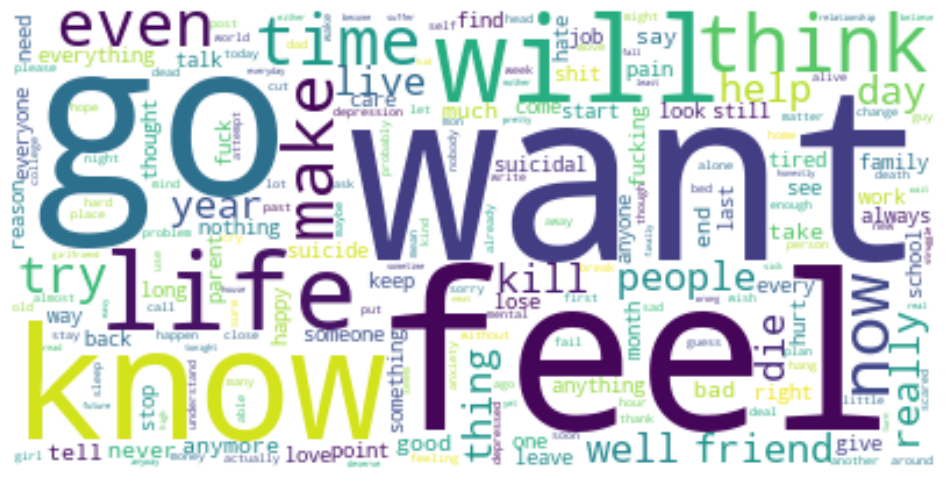

In [31]:
plt.figure(figsize=(12,12))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [32]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(2,3))


# matrix of ngrams
ngrams = c_vec.fit_transform(suicide['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_




df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [33]:
df_ngram[:30]

,frequency,bigram/trigram
0,3341,feel like
1,1293,want die
2,913,get well
3,533,want kill
4,505,year old
5,496,every day
6,469,get bad
7,466,make feel
8,451,suicidal thought
9,424,really want


In [34]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(3,4))





# matrix of ngrams
ngrams = c_vec.fit_transform(suicide['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_




df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [35]:
df_ngram[:30]

,frequency,bigram/trigram
0,159,want die want
1,142,help please help
2,140,please help please
3,133,please help please help
4,131,help please help please
5,106,want live anymore
6,106,thing get well
7,101,make feel like
8,93,need someone talk
9,89,feel like shit


In [36]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.pipeline import make_pipeline


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
nmf = NMF(n_components=40)
pipe = make_pipeline(tfidf_vectorizer, nmf)



pipe.fit(suicide['final_cleaned_textt'])




def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
        print()
    print()


In [37]:
print_top_words(nmf, tfidf_vectorizer.get_feature_names(), n_top_words=3)

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



Topic #0: feel like, life feel, life feel like


Topic #1: someone talk, need someone, need someone talk


Topic #2: want die, die want, want die want


Topic #3: help please, help please help, please help please


Topic #4: please help, someone please help, please help need


Topic #5: get well, thing get well, thing get


Topic #6: talk someone, need talk, need talk someone


Topic #7: want kill, kill want, want kill want


Topic #8: commit suicide, want commit suicide, want commit


Topic #9: fuck fuck, fuck fuck fuck, die fuck fuck


Topic #10: want live, live anymore, want live anymore


Topic #11: really want, really want die, want die


Topic #12: want fucking, want fucking die, fucking die


Topic #13: need help, help delete, need help delete


Topic #14: go kill, think go, think go kill


Topic #15: want end, end life, want end life


Topic #16: get bad, bad bad, get bad bad


Topic #17: want go, want anymore, anymore want


Topic #18: wish could, could go, wish could go


Top

In [38]:
from sklearn.decomposition import LatentDirichletAllocation


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
lda = LatentDirichletAllocation(n_components=40)
pipe = make_pipeline(tfidf_vectorizer, lda)


pipe.fit(suicide["final_cleaned_textt"])



def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
    print()

In [39]:
print_top_words(lda, tfidf_vectorizer.get_feature_names(), n_top_words=3)

Topic #0: feel like, want die, first time

Topic #1: feel like, get well, want kill

Topic #2: feel like, want die, suicidal thought

Topic #3: feel like, want die, get well

Topic #4: feel like, want kill, want die

Topic #5: feel like, really want, help help

Topic #6: feel like, want die, get well

Topic #7: feel like, want die, talk someone

Topic #8: feel like, want die, go kill

Topic #9: feel like, want die, commit suicide

Topic #10: feel like, spend rest, spend rest life

Topic #11: feel like, want die, go kill

Topic #12: feel like, help please help, help please

Topic #13: feel like, want die, get well

Topic #14: feel like, wish could, want die

Topic #15: feel like, want die, edge fuck

Topic #16: feel like, fuck fuck, fuck fuck fuck

Topic #17: feel like, want die, thank take time

Topic #18: feel like, want die, world september

Topic #19: feel like, jump front, front train

Topic #20: feel like, want die, get well

Topic #21: feel like, want die, get well

Topic #22: fe

# 

# Analyzing Depression Text**

In [40]:
unigram_df = ngrams_top(depression["final_cleaned_textt"], (1,1), n=uni_gram_num)
unigram_df[:40]


,text,count
0,just,5058
1,feel,4891
2,like,4135
3,want,3448
4,know,3029
5,don,2648
6,life,2500
7,time,2236
8,think,2172
9,make,2073


In [41]:
# fancier interactive plot using plotly express
import plotly.express as px
fig = px.bar(unigram_df, x='text', y='count', title="Counts of top unigrams", template='plotly_white', 
             labels={"ngram;: 'Unigram', 'count': 'Count'"},
            width=1000, height=600)
                                                                                                                  
fig.show()

In [42]:
text = " ".join(word for word in depression["final_cleaned_textt"])
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)

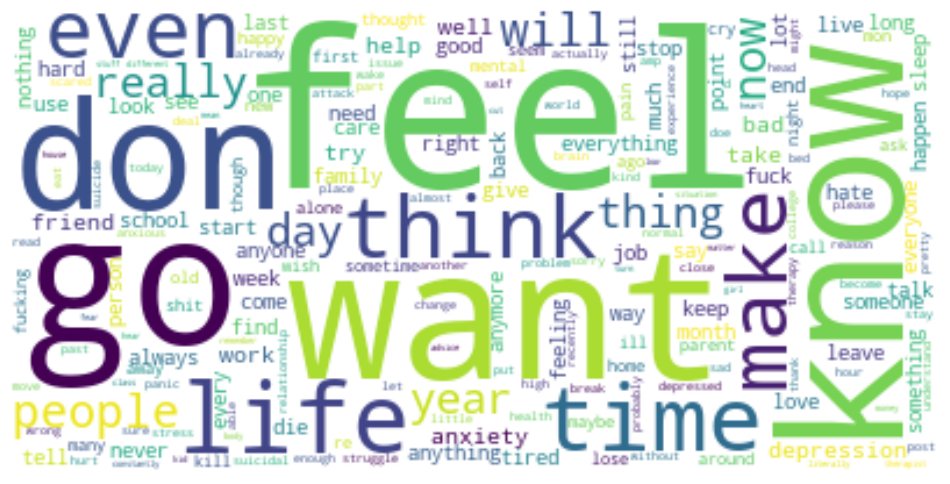

In [43]:
plt.figure(figsize=(12,12))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [47]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(2,3))


# matrix of ngrams
ngrams = c_vec.fit_transform(depression['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [48]:
df_ngram[:40]

,frequency,bigram/trigram
0,1753,feel like
1,261,mental health
2,256,get well
3,255,make feel
4,211,panic attack
5,207,every day
6,191,even though
7,182,help co
8,182,anyone else
9,180,want die


In [49]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(3,4))


# matrix of ngrams
ngrams = c_vec.fit_transform(depression['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [50]:
df_ngram[:40]

,frequency,bigram/trigram
0,59,make feel like
1,53,feel like shit
2,39,mental health issue
3,39,feel like go
4,38,make feel well
5,37,play video game
6,37,doe anyone else
7,36,life feel like
8,33,want die want
9,33,sometimes feel like


In [51]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.pipeline import make_pipeline


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
nmf = NMF(n_components=20)
pipe = make_pipeline(tfidf_vectorizer, nmf)



pipe.fit(depression['final_cleaned_textt'])




def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
        print()
    print()


In [52]:
print_top_words(nmf, tfidf_vectorizer.get_feature_names(), n_top_words=3)

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



Topic #0: disorder book, platform essentially connect, essentially connect certify


Topic #1: thelma herb, trauma anxiety depression, trauma anxiety


Topic #2: feel like, like shit, feel like shit


Topic #3: depression anxiety, thee ween, thelma herb


Topic #4: help co, depression help co, depression help


Topic #5: like live, feel kind confident, fog bad accent


Topic #6: thee ween help, ween help, witness something


Topic #7: get well, every day, anyone else


Topic #8: mental health, health depression, mental health depression


Topic #9: go away, want happy, anymore want


Topic #10: want die, die want, want die want


Topic #11: brain bleed, would know, would know brain


Topic #12: feel well, make feel, make feel well


Topic #13: back depression, spiral back depression, spiral back


Topic #14: past year, general anxiety arrest, therapist week


Topic #15: convince parent, move state, get fight


Topic #16: word depression, coin really know, sanity lose


Topic #17: feel 

In [53]:
from sklearn.decomposition import LatentDirichletAllocation


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
lda = LatentDirichletAllocation(n_components=20)
pipe = make_pipeline(tfidf_vectorizer, lda)


pipe.fit(depression["final_cleaned_textt"])



def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
    print()

In [54]:
print_top_words(lda, tfidf_vectorizer.get_feature_names(), n_top_words=3)

Topic #0: feel like, want die, get bad

Topic #1: feel like, depression anxiety loss, anxiety loss

Topic #2: feel like, help co, mental health

Topic #3: feel like, need help, get well

Topic #4: feel like, witness something, suffer depression anxiety

Topic #5: feel like, help co, also turkish

Topic #6: feel like, get well, every time

Topic #7: feel like, help co, mental health

Topic #8: feel like, hamza help, ween hull

Topic #9: feel like, common like, even know

Topic #10: feel like, make feel, help co

Topic #11: thelma herb, thee ween, love thelma herb

Topic #12: feel like, mental health, seem like

Topic #13: help co, suffer mental health, online therapy platform

Topic #14: feel like, try try, help co

Topic #15: feel like, anyone else, break depression

Topic #16: feel like, help co, get bad

Topic #17: feel like, video game, help co

Topic #18: feel like, feel know, help co

Topic #19: feel like, mental health, gel bonsai




 # 
 # Analyzing Casual Text

In [55]:
sum(casual_talk["polarity"])

47.61752317116452

In [56]:
unigram_df = ngrams_top(casual_talk["final_cleaned_textt"], (1,1), n=uni_gram_num)
unigram_df[:40]


,text,count
0,just,450
1,like,425
2,want,322
3,know,264
4,say,236
5,make,230
6,filler,207
7,think,190
8,friend,188
9,people,182


In [57]:
# fancier interactive plot using plotly express
import plotly.express as px
fig = px.bar(unigram_df, x='text', y='count', title="Counts of top unigrams", template='plotly_white', 
             labels={"ngram;: 'Unigram', 'count': 'Count'"},
            width=1000, height=600)
                                                                                                                  
fig.show()

In [58]:
text = " ".join(word for word in casual_talk["final_cleaned_textt"])
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)

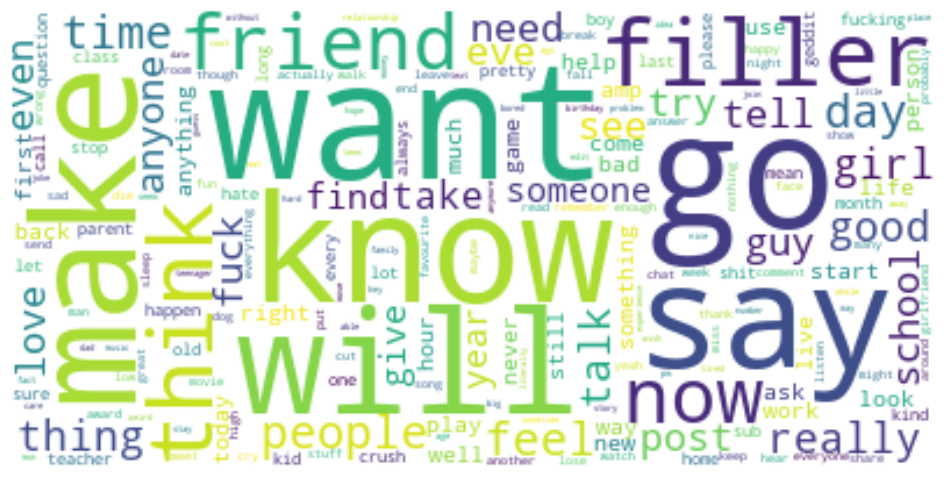

In [59]:
plt.figure(figsize=(12,12))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [60]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(2,3))


# matrix of ngrams
ngrams = c_vec.fit_transform(casual_talk['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [61]:
df_ngram[:40]

,frequency,bigram/trigram
0,188,filler filler
1,172,filler filler filler
2,96,eve eve
3,95,eve eve eve
4,54,feel like
5,43,amp amp
6,38,amp amp amp
7,27,anyone want
8,21,good friend
9,20,want talk


In [62]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(3,4))


# matrix of ngrams
ngrams = c_vec.fit_transform(casual_talk['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [63]:
df_ngram[:40]

,frequency,bigram/trigram
0,172,filler filler filler
1,156,filler filler filler filler
2,95,eve eve eve
3,94,eve eve eve eve
4,38,amp amp amp
5,35,amp amp amp amp
6,10,text text text
7,9,text text text text
8,8,filer filer filer
9,7,filer filer filer filer


In [64]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.pipeline import make_pipeline


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
nmf = NMF(n_components=20)
pipe = make_pipeline(tfidf_vectorizer, nmf)



pipe.fit(casual_talk['final_cleaned_textt'])




def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
        print()
    print()


C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\decomposition\_nmf.py:1692: ConvergenceWarning:

Maximum number of iterations 200 reached. Increase it to improve convergence.



In [65]:
print_top_words(nmf, tfidf_vectorizer.get_feature_names(), n_top_words=3)

Topic #0: filler filler, filler filler filler, ruby filler filler


Topic #1: amp amp, amp amp amp, funny number


Topic #2: want talk, anyone want talk, anyone want


Topic #3: girlfriend turn, first girlfriend turn, first girlfriend


Topic #4: free award, get free award, get free


Topic #5: get lay, amusing fact, amusing fact get


Topic #6: feel like, ever feel, ever feel like


Topic #7: mega thick, dear mega, dear mega thick


Topic #8: want die, die get, want die get


Topic #9: want chat, anyone want, anyone want chat


Topic #10: sub edit, teenager sub, teenager sub edit


Topic #11: anyone else, else get, anyone else get


Topic #12: group chat, want join, fill fill


Topic #13: go die, go die alone, die alone


Topic #14: people play, look people, look people play


Topic #15: alt account, make alt, alt account alt


Topic #16: listen song, video listen song, ignore video listen


Topic #17: good friend, say like, say yes


Topic #18: fem boy, favourite variant, fem boy fem

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [66]:
from sklearn.decomposition import LatentDirichletAllocation


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
lda = LatentDirichletAllocation(n_components=20)
pipe = make_pipeline(tfidf_vectorizer, lda)


pipe.fit(casual_talk["final_cleaned_textt"])



def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
    print()

In [67]:
print_top_words(lda, tfidf_vectorizer.get_feature_names(), n_top_words=3)

Topic #0: today birthday, thank answer, end thing boyfriend

Topic #1: alt account, put ice, anyone want

Topic #2: filler filler, filler filler filler, feel like

Topic #3: alien abduct, puff valid, go sub

Topic #4: view risk, filer filer, filer filer filer

Topic #5: shit post, join navy, plan join

Topic #6: want die, eat pizza want, pizza want

Topic #7: grow beard, really really, many cup

Topic #8: fucking idiot, today fine, get fever

Topic #9: huge cap large, huge cap, cap large

Topic #10: anyone want, eve eve, eve eve eve

Topic #11: fun fact, favourite variant, mega thick valentine

Topic #12: text text, text text text, challenge anything

Topic #13: honestly need pant, want carboy, need pant

Topic #14: girl find hilarious, find hilarious, girl find

Topic #15: tow imposter, look amp, standard sorry

Topic #16: utmost importance, huh huh, horny post

Topic #17: amp amp, amp amp amp, make alt

Topic #18: virginity yesterday boy, yesterday boy, girlfriend could

Topic #19: r

# 
# Analyzing Stressed Text**

In [68]:
sum(stressed["polarity"])

-31.813750981970703

In [70]:
unigram_df = ngrams_top(stressed["final_cleaned_textt"], (1,1), n=uni_gram_num)
unigram_df[:40]


,text,count
0,feel,852
1,just,823
2,like,773
3,know,697
4,time,530
5,want,477
6,make,432
7,think,418
8,tell,375
9,really,373


In [71]:
# fancier interactive plot using plotly express
import plotly.express as px
fig = px.bar(unigram_df, x='text', y='count', title="Counts of top unigrams", template='plotly_white', 
             labels={"ngram;: 'Unigram', 'count': 'Count'"},
            width=1000, height=600)
                                                                                                                  
fig.show()

In [72]:
text = " ".join(word for word in stressed["final_cleaned_textt"])
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)

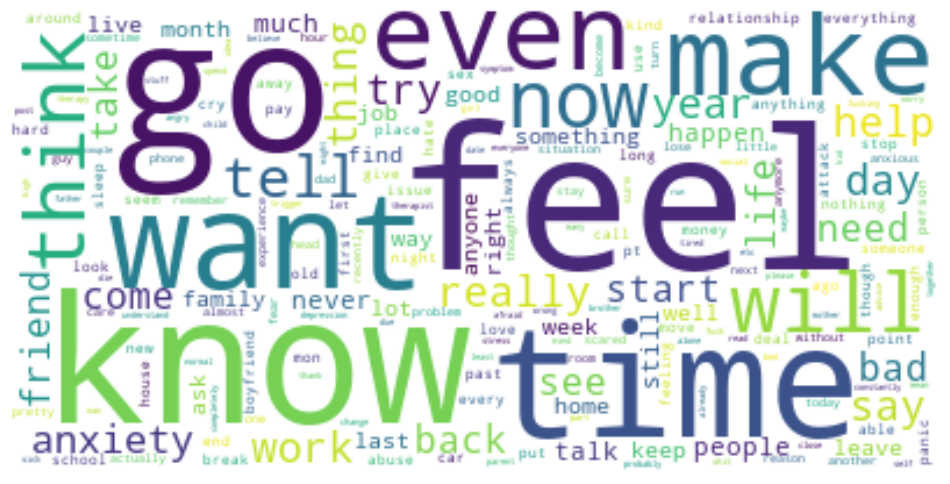

In [73]:
plt.figure(figsize=(12,12))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [74]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(2,3))


# matrix of ngrams
ngrams = c_vec.fit_transform(stressed['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [75]:
df_ngram[:40]

,frequency,bigram/trigram
0,309,feel like
1,77,panic attack
2,51,make feel
3,48,go back
4,45,year old
5,44,even though
6,43,anyone else
7,36,month ago
8,33,try get
9,31,come back


In [76]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
stoplist = stopwords.words('english')


c_vec = CountVectorizer(stop_words=stoplist, ngram_range=(3,4))


# matrix of ngrams
ngrams = c_vec.fit_transform(stressed['final_cleaned_textt'])





# count frequency of ngrams
count_values = ngrams.toarray().sum(axis=0)
# list of ngrams
vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) for k,i in vocab.items()], reverse=True)
            ).rename(columns={0: 'frequency', 1:'bigram/trigram'})

In [77]:
df_ngram[:40]

,frequency,bigram/trigram
0,13,make feel like
1,11,long story short
2,11,know feel like
3,10,feel like go
4,8,mental health issue
5,8,feel like shit
6,7,would greatly appreciate
7,7,make feel bad
8,7,feel like need
9,6,time feel like


In [78]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.pipeline import make_pipeline


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
nmf = NMF(n_components=20)
pipe = make_pipeline(tfidf_vectorizer, nmf)



pipe.fit(stressed['final_cleaned_textt'])




def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
        print()
    print()


In [79]:
print_top_words(nmf, tfidf_vectorizer.get_feature_names(), n_top_words=3)

Topic #0: feel like, know feel, know feel like


Topic #1: middle school like, help molest, express emotion


Topic #2: account need, want minimum, instead academic lot


Topic #3: soon possible, look full house, type situation room


Topic #4: place put, people life really, sorry need place


Topic #5: find friend stay, even license literally, unsure currently unemployed


Topic #6: panic attack often, absolutely necessary like, work something service


Topic #7: even though try, time weight, summary complete


Topic #8: everyday depress, less compare, depression anything memory


Topic #9: social service, mentally ill, safety security guy


Topic #10: many way, way feel, feel awful


Topic #11: never ever think, ever think, never ever


Topic #12: scared find love, find love, scared find


Topic #13: feel bad, make feel, make feel bad


Topic #14: panic attack, heart attack, attack get


Topic #15: need help, help need, really need


Topic #16: today really bad, today really, really 

C:\Users\prana\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [80]:
from sklearn.decomposition import LatentDirichletAllocation


tfidf_vectorizer = TfidfVectorizer(stop_words=stoplist, ngram_range=(2,3))
lda = LatentDirichletAllocation(n_components=20)
pipe = make_pipeline(tfidf_vectorizer, lda)


pipe.fit(stressed["final_cleaned_textt"])



def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += ", ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
        print()
    print()

In [81]:
print_top_words(lda, tfidf_vectorizer.get_feature_names(), n_top_words=3)

Topic #0: feel like, soon possible, want stop

Topic #1: feel like, feel guilty, heart attack

Topic #2: feel like, fault feel like, seem like

Topic #3: feel like, know need, get job

Topic #4: feel like, make feel, feel super

Topic #5: feel like, sleep light, take care

Topic #6: feel like, year old, panic attack

Topic #7: feel like, get point, house school

Topic #8: every day, feel like, get sex

Topic #9: go back, know trust, panic attack

Topic #10: feel like, anyone else, seem work

Topic #11: feel like, move back, even though

Topic #12: feel like, thing like, go away

Topic #13: feel like, try get, week ago

Topic #14: feel like, sleep sleep, get well

Topic #15: feel like, come home, like good

Topic #16: feel like, help break, baby girl

Topic #17: leave house, feel like, find way

Topic #18: feel bad, feel like, month ago

Topic #19: feel like, like know, could go


